In [1251]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('wrangled.csv')


In [1252]:
df.head()

,Unnamed: 0,schedule_date,schedule_season,schedule_week,schedule_playoff,team_home,score_home,score_away,team_away,team_favorite_id,spread_favorite,over_under_line,stadium,stadium_neutral,weather_temperature,weather_wind_mph,weather_humidity,weather_detail,home_id,away_id
0,0,09/01/1979,1979,1,False,Tampa Bay Buccaneers,31,16,Detroit Lions,TB,-3.0,30,Houlihan's Stadium,False,79.0,9.0,87.0,NaN,TB,DET
1,1,09/02/1979,1979,1,False,Buffalo Bills,7,9,Miami Dolphins,MIA,-5.0,39,Ralph Wilson Stadium,False,74.0,15.0,74.0,NaN,BUF,MIA
2,2,09/02/1979,1979,1,False,Chicago Bears,6,3,Green Bay Packers,CHI,-3.0,31,Soldier Field,False,78.0,11.0,68.0,NaN,CHI,GB
3,3,09/02/1979,1979,1,False,Denver Broncos,10,0,Cincinnati Bengals,DEN,-3.0,31.5,Mile High Stadium,False,69.0,6.0,38.0,NaN,DEN,CIN
4,4,09/02/1979,1979,1,False,Kansas City Chiefs,14,0,Baltimore Colts,KC,-1.0,37,Arrowhead Stadium,False,76.0,8.0,71.0,NaN,KC,IND


In [1253]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10177 entries, 0 to 10176
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           10177 non-null  int64  
 1   schedule_date        10177 non-null  object 
 2   schedule_season      10177 non-null  int64  
 3   schedule_week        10177 non-null  object 
 4   schedule_playoff     10177 non-null  bool   
 5   team_home            10177 non-null  object 
 6   score_home           10177 non-null  int64  
 7   score_away           10177 non-null  int64  
 8   team_away            10177 non-null  object 
 9   team_favorite_id     10177 non-null  object 
 10  spread_favorite      10177 non-null  float64
 11  over_under_line      10177 non-null  object 
 12  stadium              10177 non-null  object 
 13  stadium_neutral      10177 non-null  bool   
 14  weather_temperature  9665 non-null   float64
 15  weather_wind_mph     9665 non-null  

In [1254]:
#double up the data so there is a row for each team in each game

data1 = [df["schedule_date"], df["schedule_season"], df["schedule_week"], df["schedule_playoff"], df["home_id"],df["score_home"], df["away_id"], df["score_away"], df["team_favorite_id"], df["spread_favorite"], df["over_under_line"]]
data2 = [df["schedule_date"], df["schedule_season"], df["schedule_week"], df["schedule_playoff"], df["away_id"],df["score_away"], df["home_id"], df["score_home"], df["team_favorite_id"], df["spread_favorite"], df["over_under_line"]]



headers = ["date", "season","week","playoff","team_id","team_score","opponent_id","opponent_score","favorite","spread","overunder"]

hometeams = pd.concat(data1, axis=1, keys=headers)
awayteams = pd.concat(data2, axis=1, keys=headers)

hometeams['home'] = 1
awayteams['home'] = 0

In [1255]:
awayteams.head()

,date,season,week,playoff,team_id,team_score,opponent_id,opponent_score,favorite,spread,overunder,home
0,09/01/1979,1979,1,False,DET,16,TB,31,TB,-3.0,30,0
1,09/02/1979,1979,1,False,MIA,9,BUF,7,MIA,-5.0,39,0
2,09/02/1979,1979,1,False,GB,3,CHI,6,CHI,-3.0,31,0
3,09/02/1979,1979,1,False,CIN,0,DEN,10,DEN,-3.0,31.5,0
4,09/02/1979,1979,1,False,IND,0,KC,14,KC,-1.0,37,0


In [1256]:
df = pd.concat([hometeams,awayteams],ignore_index=True)

In [1257]:
df.shape

(20354, 12)

In [1258]:
df['week'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', 'Wildcard', 'Division', 'Conference',
       'Superbowl', '17', '18', 'WildCard', 'SuperBowl'], dtype=object)

In [1259]:
#get rid of playoffs
keeps = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12','13', '14', '15', '16','17','18']

df = df[df.week.isin(keeps)]

In [1260]:
df['week'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18'], dtype=object)

In [1261]:
df['week'] = df['week'].astype(np.int64)

In [1262]:
df.sort_values(by=['season','team_id','week'], inplace=True)

In [1263]:
#add previous week - bye weeks mean not necessarily week-1
df['prev_week'] = df.week.shift(1)

In [1264]:
df.loc[(df['season'] == 1999) & (df['team_id'] == 'DEN')]

,date,season,week,playoff,team_id,team_score,opponent_id,opponent_score,favorite,spread,overunder,home,prev_week
4608,09/13/1999,1999,1,False,DEN,21,MIA,38,DEN,-6.0,43,1,17.0
14792,09/19/1999,1999,2,False,DEN,10,KC,26,DEN,-3.5,40.5,0,1.0
14813,09/26/1999,1999,3,False,DEN,10,TB,13,TB,-2.5,38,0,2.0
4643,10/03/1999,1999,4,False,DEN,13,NYJ,21,DEN,-5.5,40,1,3.0
14838,10/10/1999,1999,5,False,DEN,16,OAK,13,OAK,-7.0,38,0,4.0
4671,10/17/1999,1999,6,False,DEN,31,GB,10,GB,-3.5,40,1,5.0
14863,10/24/1999,1999,7,False,DEN,23,NE,24,NE,-3.5,40.5,0,6.0
4698,10/31/1999,1999,8,False,DEN,20,MIN,23,MIN,-2.5,45,1,7.0
14894,11/07/1999,1999,9,False,DEN,33,LAC,17,PICK,0.0,35.5,0,8.0
14910,11/14/1999,1999,10,False,DEN,17,SEA,20,SEA,-5.5,41,0,9.0


In [1266]:
#add cumulative point totals
df['points_for'] = df.groupby(['season','team_id'])['team_score'].transform(pd.Series.cumsum)
df['points_against'] = df.groupby(['season','team_id'])['opponent_score'].transform(pd.Series.cumsum)

In [1267]:
df.head(450)

,date,season,week,playoff,team_id,team_score,opponent_id,opponent_score,favorite,spread,overunder,home,prev_week,points_for,points_against
11,09/02/1979,1979,1,False,ARI,21,DAL,22,DAL,-4.0,37,1,NaN,21,22
10200,09/09/1979,1979,2,False,ARI,27,NYG,14,ARI,-3.0,36,0,1.0,48,36
40,09/16/1979,1979,3,False,ARI,21,PIT,24,PIT,-6.0,40,1,2.0,69,60
53,09/23/1979,1979,4,False,ARI,7,WAS,17,ARI,-3.0,39,1,3.0,76,77
10239,09/30/1979,1979,5,False,ARI,0,LAR,21,LAR,-6.0,38,0,4.0,76,98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,12/02/1979,1979,14,False,WAS,38,GB,21,WAS,-9.0,34,1,13.0,286,246
208,12/09/1979,1979,15,False,WAS,28,CIN,14,WAS,-6.0,42,1,14.0,314,260
10392,12/16/1979,1979,16,False,WAS,34,DAL,35,DAL,-8.0,39.5,0,15.0,348,295
245,09/07/1980,1980,1,False,ARI,35,NYG,41,ARI,-7.0,42,1,16.0,35,41


In [1268]:
df['overunder'].unique()

array(['37', '36', '40', '39', '38', '42', '43', '32', '35.5', '35', '45',
       '34', '44', '41', '31', '31.5', '44.5', '39.5', '30', '33', '42.5',
       '36.5', '40.5', '49', '50', '46', '48', '47', '51', '54', '45.5',
       '43.5', '46.5', '52', '52.5', '54.5', '47.5', '38.5', '37.5',
       '34.5', '41.5', '53', '55', '53.5', '48.5', '49.5', '50.5', '51.5',
       '56', '33.5', '28', '32.5', '36.6', '29.5', '58.5', '59.5', '58',
       '55.5', '63', '56.5', '57', '60', '30.5', '57.5', '59', '61.5',
       '63.5'], dtype=object)

In [1269]:
df['overunder'] = df['overunder'].astype(np.float)

In [1270]:
#add flag if team covered spread, and by how much
df['covered_by'] = np.where(df['team_id'] == df['favorite'], df['team_score'] - df['opponent_score'] + df['spread'], df['opponent_score'] - df['team_score'] + df['spread'])
df['covered_over_by'] = ((df['team_score'] + df['opponent_score']) - df['overunder'])


In [1273]:
df.prev_week.unique()

array([nan,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18.])

In [1274]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19484 entries, 11 to 20331
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date             19484 non-null  object 
 1   season           19484 non-null  int64  
 2   week             19484 non-null  int64  
 3   playoff          19484 non-null  bool   
 4   team_id          19484 non-null  object 
 5   team_score       19484 non-null  int64  
 6   opponent_id      19484 non-null  object 
 7   opponent_score   19484 non-null  int64  
 8   favorite         19484 non-null  object 
 9   spread           19484 non-null  float64
 10  overunder        19484 non-null  float64
 11  home             19484 non-null  int64  
 12  prev_week        19483 non-null  float64
 13  points_for       19484 non-null  int64  
 14  points_against   19484 non-null  int64  
 15  covered_by       19484 non-null  float64
 16  covered_over_by  19484 non-null  float64
dtypes: bool(1),

In [1275]:
df['covered'] = np.where(df['covered_by'] > 0, 1,0)

In [1276]:
df['covered_over'] = np.where(df['covered_over_by'] > 0, 1,0)

In [1277]:
df['push'] = np.where(df['covered_by'] == 0, 1,0)

In [1278]:
df['push_over'] = np.where(df['covered_over_by'] == 0, 1,0)

In [1279]:
df['win_by'] = df['team_score'] - df['opponent_score']

In [1280]:
df['win'] = np.where(df['win_by'] > 0, 1,0)

In [1281]:
df['loss'] = np.where(df['win_by'] < 0, 1,0)

In [1282]:
df['tie'] = np.where(df['win_by'] == 0, 1,0)

In [1283]:
df['total_wins'] = df.groupby(['season','team_id'])['win'].transform(pd.Series.cumsum)
df['total_losses'] = df.groupby(['season','team_id'])['loss'].transform(pd.Series.cumsum)
df['win_loss_ratio'] = (df['total_wins'])/np.where(df['total_losses'] == 0, 1,df['total_losses'])
df['pfa_ratio'] = (df['points_for'])/np.where(df['points_against'] == 0, 1,df['points_against'])
df['net_wins'] = df['total_wins']-df['total_losses']
df['net_pfa'] = df['points_for']-df['points_against']
df['net_pfa_avg'] = (df['points_for']-df['points_against'])/df['week']

In [1284]:
df['push'].value_counts()

0    18930
1    554  
Name: push, dtype: int64

In [1285]:
df['favorite'].value_counts()

PIT     850
NE      822
DEN     816
DAL     802
SF      786
GB      746
PHI     732
MIN     712
MIA     680
NO      652
NYG     650
LAC     646
SEA     644
KC      628
WAS     614
LAR     612
CHI     606
OAK     606
TEN     602
BUF     594
ATL     584
IND     580
NYJ     564
CIN     516
TB      476
DET     474
BAL     438
ARI     420
CLE     414
CAR     378
JAX     322
PICK    282
HOU     236
Name: favorite, dtype: int64

In [1286]:
#remove zero spread rows
df = df[(df.favorite != "PICK")]
#remove week 1 rows - previous week not valid
df = df[(df.week != 1)]

In [1287]:
df.sort_values(by=['season','week','home'], inplace=True)

In [1288]:
#bring previous week results into current week
df = df.merge(df,how='left',suffixes=('', '_p'), left_on=['team_id','season','prev_week'], right_on=['team_id','season','week'])

In [1289]:
df_output = df.groupby('home').mean().T
df_output
#confirm averages make sense - home teams score 2.5pts more on average

home,0,1
season,2000.02,2000.02
week,9.58858,9.5904
playoff,False,False
team_score,19.9232,22.6155
opponent_score,22.6226,19.9211
spread,-5.48417,-5.48439
overunder,41.9082,41.9071
prev_week,8.52671,8.52472
points_for,188.69,190.348
points_against,190.041,188.828


In [1290]:
#identify teams that lost outright in previous week despite being favored
df['bounce_candidate'] = np.where((df['team_id'] == df['favorite_p']) & (df['win_p'] == 0), 1,0)

In [1291]:
df['bounce_candidate'].value_counts()

0    15162
1    2840 
Name: bounce_candidate, dtype: int64

In [1292]:
pd.set_option("display.max.columns", None)
df.loc[(df['season'] == 1999) & (df['team_id'] == 'DEN')]

,date,season,week,playoff,team_id,team_score,opponent_id,opponent_score,favorite,spread,overunder,home,prev_week,points_for,points_against,covered_by,covered_over_by,covered,covered_over,push,push_over,win_by,win,loss,tie,total_wins,total_losses,win_loss_ratio,pfa_ratio,net_wins,net_pfa,net_pfa_avg,date_p,week_p,playoff_p,team_score_p,opponent_id_p,opponent_score_p,favorite_p,spread_p,overunder_p,home_p,prev_week_p,points_for_p,points_against_p,covered_by_p,covered_over_by_p,covered_p,covered_over_p,push_p,push_over_p,win_by_p,win_p,loss_p,tie_p,total_wins_p,total_losses_p,win_loss_ratio_p,pfa_ratio_p,net_wins_p,net_pfa_p,net_pfa_avg_p,bounce_candidate
8049,09/19/1999,1999,2,False,DEN,10,KC,26,DEN,-3.5,40.5,0,1.0,31,64,-19.5,-4.5,0,0,0,0,-16,0,1,0,0,2,0.000000,0.484375,-2,-33,-16.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
8080,09/26/1999,1999,3,False,DEN,10,TB,13,TB,-2.5,38.0,0,2.0,41,77,0.5,-15.0,1,0,0,0,-3,0,1,0,0,3,0.000000,0.532468,-3,-36,-12.000000,09/19/1999,2.0,False,10.0,KC,26.0,DEN,-3.5,40.5,0.0,1.0,31.0,64.0,-19.5,-4.5,0.0,0.0,0.0,0.0,-16.0,0.0,1.0,0.0,0.0,2.0,0.000000,0.484375,-2.0,-33.0,-16.500000,1
8121,10/03/1999,1999,4,False,DEN,13,NYJ,21,DEN,-5.5,40.0,1,3.0,54,98,-13.5,-6.0,0,0,0,0,-8,0,1,0,0,4,0.000000,0.551020,-4,-44,-11.000000,09/26/1999,3.0,False,10.0,TB,13.0,TB,-2.5,38.0,0.0,2.0,41.0,77.0,0.5,-15.0,1.0,0.0,0.0,0.0,-3.0,0.0,1.0,0.0,0.0,3.0,0.000000,0.532468,-3.0,-36.0,-12.000000,0
8135,10/10/1999,1999,5,False,DEN,16,OAK,13,OAK,-7.0,38.0,0,4.0,70,111,-10.0,-9.0,0,0,0,0,3,1,0,0,1,4,0.250000,0.630631,-3,-41,-8.200000,10/03/1999,4.0,False,13.0,NYJ,21.0,DEN,-5.5,40.0,1.0,3.0,54.0,98.0,-13.5,-6.0,0.0,0.0,0.0,0.0,-8.0,0.0,1.0,0.0,0.0,4.0,0.000000,0.551020,-4.0,-44.0,-11.000000,1
8177,10/17/1999,1999,6,False,DEN,31,GB,10,GB,-3.5,40.0,1,5.0,101,121,-24.5,1.0,0,1,0,0,21,1,0,0,2,4,0.500000,0.834711,-2,-20,-3.333333,10/10/1999,5.0,False,16.0,OAK,13.0,OAK,-7.0,38.0,0.0,4.0,70.0,111.0,-10.0,-9.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,1.0,4.0,0.250000,0.630631,-3.0,-41.0,-8.200000,0
8191,10/24/1999,1999,7,False,DEN,23,NE,24,NE,-3.5,40.5,0,6.0,124,145,-2.5,6.5,0,1,0,0,-1,0,1,0,2,5,0.400000,0.855172,-3,-21,-3.000000,10/17/1999,6.0,False,31.0,GB,10.0,GB,-3.5,40.0,1.0,5.0,101.0,121.0,-24.5,1.0,0.0,1.0,0.0,0.0,21.0,1.0,0.0,0.0,2.0,4.0,0.500000,0.834711,-2.0,-20.0,-3.333333,0
8232,10/31/1999,1999,8,False,DEN,20,MIN,23,MIN,-2.5,45.0,1,7.0,144,168,0.5,-2.0,1,0,0,0,-3,0,1,0,2,6,0.333333,0.857143,-4,-24,-3.000000,10/24/1999,7.0,False,23.0,NE,24.0,NE,-3.5,40.5,0.0,6.0,124.0,145.0,-2.5,6.5,0.0,1.0,0.0,0.0,-1.0,0.0,1.0,0.0,2.0,5.0,0.400000,0.855172,-3.0,-21.0,-3.000000,0
8271,11/14/1999,1999,10,False,DEN,17,SEA,20,SEA,-5.5,41.0,0,9.0,194,205,-2.5,-4.0,0,0,0,0,-3,0,1,0,3,7,0.428571,0.946341,-4,-11,-1.100000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
8315,11/22/1999,1999,11,False,DEN,27,OAK,21,DEN,-1.5,37.0,1,10.0,221,226,4.5,11.0,1,1,0,0,6,1,0,0,4,7,0.571429,0.977876,-3,-5,-0.454545,11/14/1999,10.0,False,17.0,SEA,20.0,SEA,-5.5,41.0,0.0,9.0,194.0,205.0,-2.5,-4.0,0.0,0.0,0.0,0.0,-3.0,0.0,1.0,0.0,3.0,7.0,0.428571,0.946341,-4.0,-11.0,-1.100000,0
8377,12/05/1999,1999,13,False,DEN,10,KC,16,DEN,-3.5,38.5,1,11.0,231,242,-9.5,-12.5,0,0,0,0,-6,0,1,0,4,8,0.500000,0.954545,-4,-11,-0.846154,11/22/1999,11.0,False,27.0,OAK,21.0,DEN,-1.5,37.0,1.0,10.0,221.0,226.0,4.5,11.0,1.0,1.0,0.0,0.0,6.0,1.0,0.0,0.0,4.0,7.0,0.571429,0.977876,-3.0,-5.0,-0.454545,0


In [1293]:
df = df.dropna()
df.shape

(16558, 63)

In [1294]:
df.columns

Index(['date', 'season', 'week', 'playoff', 'team_id', 'team_score',
       'opponent_id', 'opponent_score', 'favorite', 'spread', 'overunder',
       'home', 'prev_week', 'points_for', 'points_against', 'covered_by',
       'covered_over_by', 'covered', 'covered_over', 'push', 'push_over',
       'win_by', 'win', 'loss', 'tie', 'total_wins', 'total_losses',
       'win_loss_ratio', 'pfa_ratio', 'net_wins', 'net_pfa', 'net_pfa_avg',
       'date_p', 'week_p', 'playoff_p', 'team_score_p', 'opponent_id_p',
       'opponent_score_p', 'favorite_p', 'spread_p', 'overunder_p', 'home_p',
       'prev_week_p', 'points_for_p', 'points_against_p', 'covered_by_p',
       'covered_over_by_p', 'covered_p', 'covered_over_p', 'push_p',
       'push_over_p', 'win_by_p', 'win_p', 'loss_p', 'tie_p', 'total_wins_p',
       'total_losses_p', 'win_loss_ratio_p', 'pfa_ratio_p', 'net_wins_p',
       'net_pfa_p', 'net_pfa_avg_p', 'bounce_candidate'],
      dtype='object')

In [1295]:
pairplotvars = ['week', 'favorite', 'spread', 'overunder',
       'home', 'covered', 'covered_over', 'win_by',
       'win', 'loss', 'team_score_p', 'opponent_score_p', 'favorite_p', 'spread_p', 'overunder_p', 'home_p',
       'points_for_p', 'points_against_p', 'covered_by_p', 'covered_over_by_p',
       'covered_p', 'covered_over_p', 'push_p', 'push_over_p',
       'win_by_p', 'win_p', 'loss_p', 'tie_p', 'total_wins_p',
       'total_losses_p','win_loss_ratio_p', 'pfa_ratio_p', 'net_wins_p', 'net_pfa_p',
       'net_pfa_avg_p', 'bounce_candidate']

dfp = df[pairplotvars]

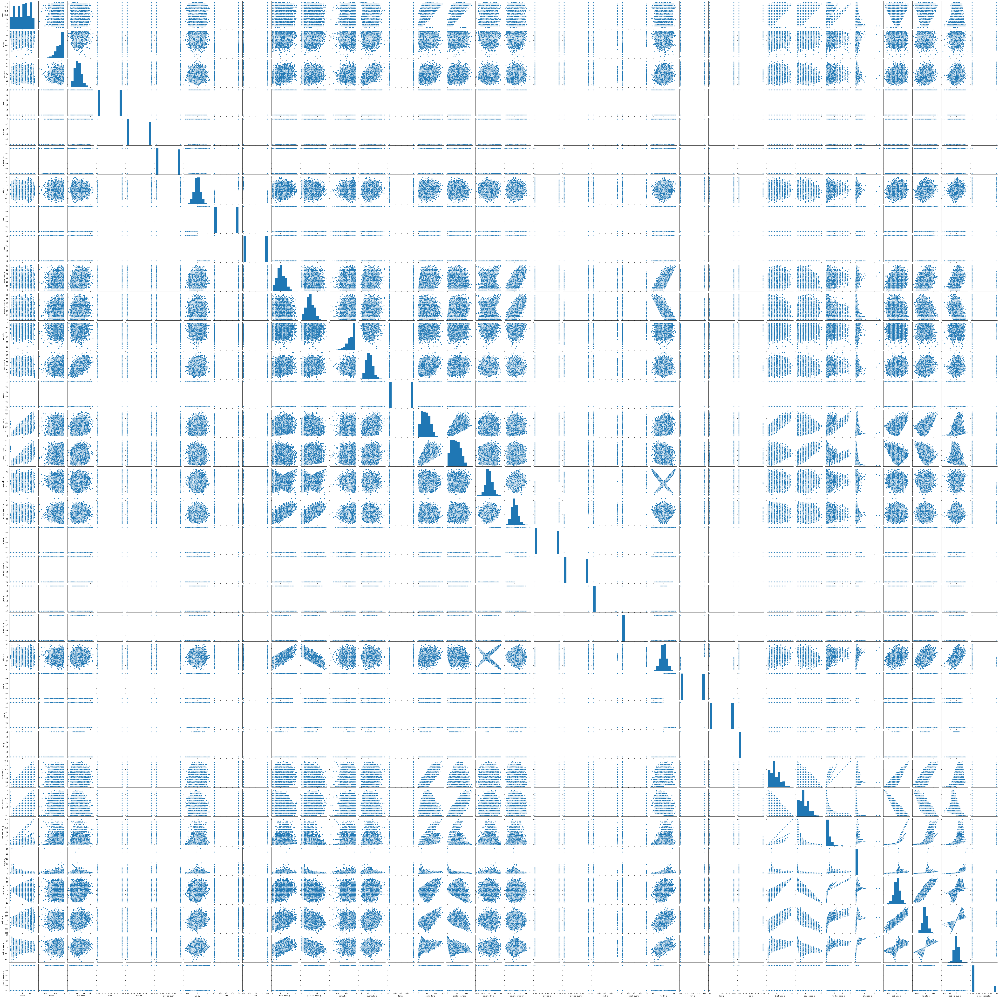

In [1296]:

#Create a pairplot for all numeric variables
sns.pairplot(dfp,  palette='Set1')
plt.show()

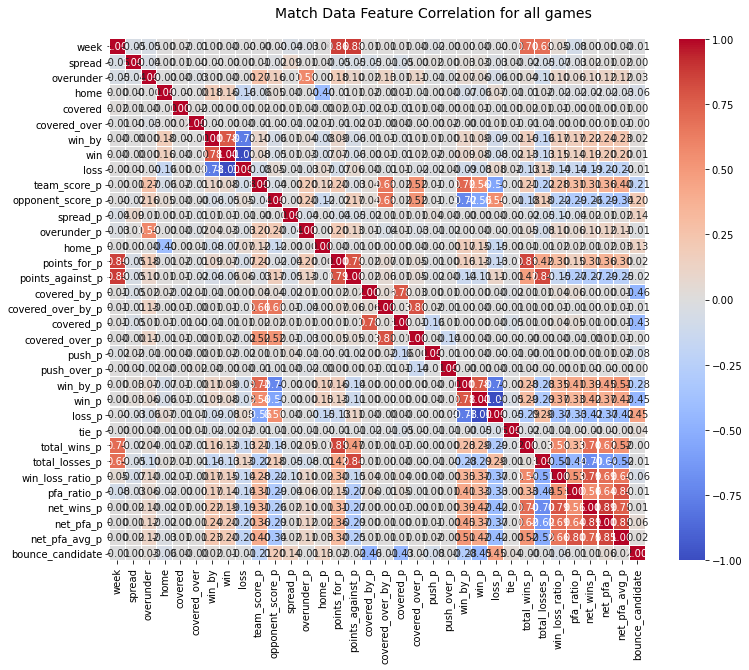

In [1297]:
#correlation matrix 1
#Create a correlation heatmap for looking at the correlation of all variables/features for all games
corrmat = dfp.corr()
f, ax = plt.subplots(figsize=(12, 9))
hm = sns.heatmap(round(corrmat,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Match Data Feature Correlation for all games', fontsize=14)

In [1317]:
#sns.jointplot(x='bounce_candidate', y='win', data=dfp, kind="reg");
len(df.loc[(df['bounce_candidate'] == 1) & (df['covered'] == 0)]) 
#len(df.loc[(df['bounce_candidate'] == 1) & (df['win'] == 0)])

1493

In [1310]:

testvars = ['win_by_p', 'win_p', 'loss_p', 'tie_p', 'total_wins_p','total_losses_p','win_loss_ratio_p', 'pfa_ratio_p', 'net_wins_p', 'net_pfa_p','net_pfa_avg_p']
yvar = testvars = ['win', 'win', 'win', 'win', 'win','win','win', 'win', 'win', 'win','win']

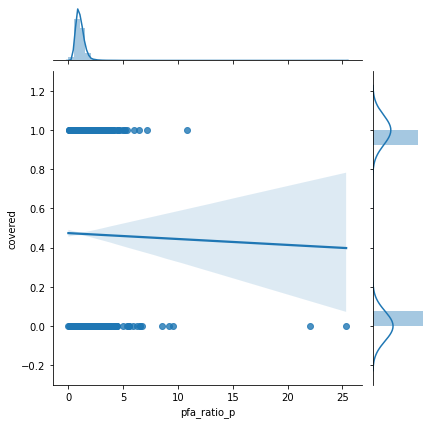

In [1315]:
sns.jointplot(x='pfa_ratio_p', y='covered', data=dfp, kind="reg");

Text(0.5, 1.0, 'bounce candidate covers')

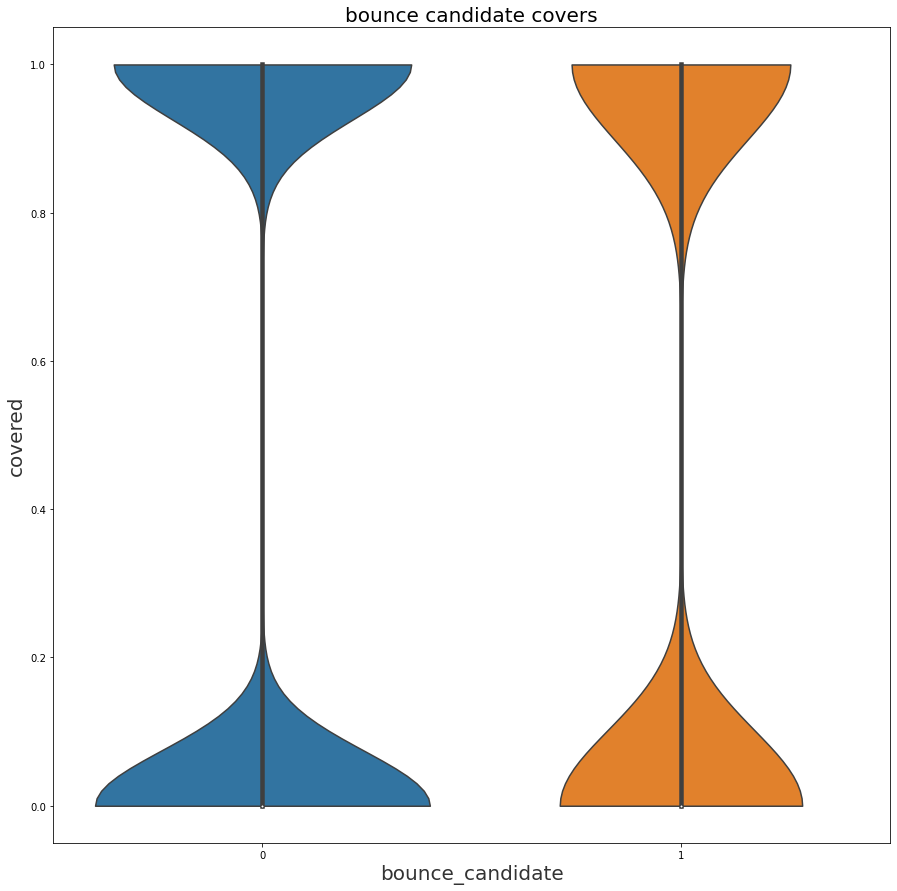

In [1336]:
#sns.jointplot(x='bounce_candidate', y='covered', data=dfp, kind="reg"); 
#sns.swarmplot(x = "bounce_candidate", y = "covered", data = dfp)
#plt.show()
fig, ax = plt.subplots(figsize=(15, 15))
ax = sns.violinplot(x="bounce_candidate", y="covered",  data=dfp, cut = 0)
ax.set_xlabel("bounce_candidate",size = 20,alpha=0.8)
ax.set_ylabel("covered",size = 20,alpha=0.8)
ax.set_title("bounce candidate covers",size=20)

In [1331]:
print('bounce no cover: ' + str(len(df.loc[(df['bounce_candidate'] == 1) & (df['covered'] == 0)])) + ' bounce cover: ' + str(len(df.loc[(df['bounce_candidate'] == 1) & (df['covered'] == 1)])))

bounce no cover: 1493 bounce cover: 1347


In [1334]:
print('bounce win: ' + str(len(df.loc[(df['bounce_candidate'] == 1) & (df['win'] == 1)])) + ' bounce lose: ' + str(len(df.loc[(df['bounce_candidate'] == 1) & (df['loss'] == 1)])))

bounce win: 1433 bounce lose: 1400


In [ ]:
#at first glance slight tendency for teams to win on the bounce but maybe bigger negative correlation to cover the spread.  
#Need to validate and look for other independent correlations